In [1]:
import cv2
import numpy as np
# import image
from PIL import Image, ImageEnhance
from numpy import asarray
import matplotlib.pyplot as plt
import skimage
import pandas as pd
import itertools
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from skimage import data,measure, io, img_as_ubyte
from skimage.filters import threshold_otsu
from skimage.segmentation import clear_border
from skimage.measure import label, regionprops
from skimage.morphology import closing, square
from skimage.color import label2rgb,rgb2gray

In [2]:
def add_visible_watermark(img, logo, intensity, w_img, h_img):
    h_logo, w_logo, c_img = logo.shape
    y_up = h_img + int(h_logo/2)
    x_left = w_img - int(w_logo/2)
    y_down = h_img -int(h_logo/2)
    x_right = w_img + int(w_logo/2)+1

    print("y_down: ", y_down)
    print("y_up: ", y_up)
    print("x_left: ", x_left)
    print("x_right: ", x_right)
    print("shape: ", img.shape)
    img[y_down : y_up, x_left: x_right] = img[y_down : y_up, x_left: x_right] - (logo-intensity)
    return img

In [3]:
img = cv2.imread("Lotus.jpg")
watermark = cv2.imread("watermark.png")
img.shape

(1233, 778, 3)

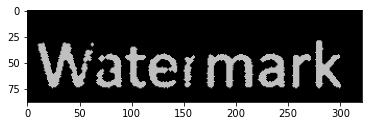

In [4]:
plt.imshow(watermark)

In [5]:
watermark.shape

(88, 321, 3)

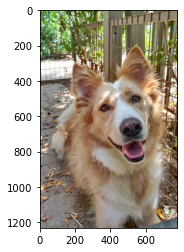

In [6]:
image = Image.open('Lotus.jpg')
plt.imshow(image)

y_down:  1056
y_up:  1144
x_left:  440
x_right:  761
shape:  (1233, 778, 3)


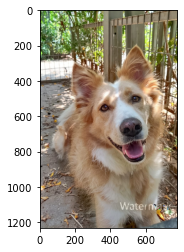

In [7]:
img = cv2.imread("Lotus.jpg")
img2 = add_visible_watermark(img, watermark, 0.25, 600, 1100)

cv2.imwrite("Lotus_watermark2.jpg",img2)
image2 = Image.open('Lotus_watermark2.jpg')
plt.imshow(image2)

y_down:  1056
y_up:  1144
x_left:  240
x_right:  561
shape:  (1233, 778, 3)


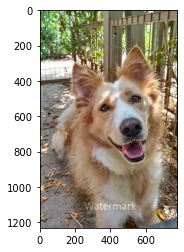

In [8]:
img = cv2.imread("Lotus.jpg")
img3 = add_visible_watermark(img, watermark, 0.5, 400, 1100)

cv2.imwrite("Lotus_watermark3.jpg",img3)
image3 = Image.open('Lotus_watermark3.jpg')
plt.imshow(image3)

In [11]:
##### סעיף 2 #####

def add_invisible_watermark(img,watermark):
    i=0
    data = "0"
    for x in watermark:
        for y in x:
            for z in y:
                data += str(z)
    with Image.open("Lotus.jpg") as inv_wa_img:
        width, height = inv_wa_img.size
        for x,y,n in itertools.product(range(width), range(height), range(3)):
            pixel = list(inv_wa_img.getpixel((x, y)))
            if(i<len(data)):
                pixel[n] = pixel[n] & ~1 | int(data[i]) # (pixel[n] and not 1) or data
                i+=1
            inv_wa_img.putpixel((x,y), tuple(pixel))
        inv_wa_img.save("source_secret.png", "PNG")
    plt.imshow(inv_wa_img)
    return inv_wa_img


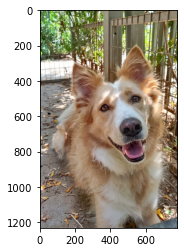

In [12]:
img = cv2.imread("Lotus.jpg")
watermark = cv2.imread("watermark.png")
inv_wa_img = add_invisible_watermark(img,watermark)

In [13]:
### סעיף 3 ###
def check_changes(im2):
    with Image.open("source_secret.png") as im1:
            width, height = im1.size
            if (im1.size!= im2.size): return "Different images!"
            for x,y in itertools.product(range(width), range(height)):
                pixel = list(im1.getpixel((x, y)))
                pixel2 =list(im2.getpixel((x,y)))
                for n in range(0,3):
                    if(pixel[n]!=pixel2[n]): return "Changed!!!"
    return "Pure Image!"

In [14]:
img = cv2.imread("Lotus.jpg")
IMAGE = Image.open('Lotus.jpg')

In [15]:
print("equal = ",check_changes(inv_wa_img)) #  same image

equal =  Pure Image!


In [16]:
print("equal = ",check_changes(IMAGE)) # same image after a tiny filter

equal =  Changed!!!


In [44]:
######## סעיף 4 ########

def object_in_img(image, blur):
    plt.imshow(image)
    df = pd.DataFrame(index=range(11), columns=["Threshold","Num_of_Pens_Found","FP","FN"])
    image = image[:,:, 1]
    thresh = threshold_otsu(image) -10
    print("Original thresh = ",threshold_otsu(image))
    for i in range(11):
        thresh += 10
        print("threshold = ", thresh)
        df["Threshold"][i] = thresh
        bw = closing(image > thresh, square(4))
        cleared = clear_border(bw)

        # label image regions
        label_image = label(cleared)
        # to make the background transparent, pass the value of `bg_label`,
        # and leave `bg_color` as `None` and `kind` as `overlay`
        image_label_overlay = label2rgb(label_image, image=image, bg_label=0)

        fig, ax = plt.subplots(figsize=(10, 6))
        ax.imshow(image_label_overlay)
        counter = 0
        av_min = 0
        av_max =0
        for region in regionprops(label_image):
            if region.area >= 500:
                # draw rectangle around segmented pens
                minr, minc, maxr, maxc = region.bbox
                max_line = max(maxc - minc,maxr - minr)
                min_line = min(maxc - minc,maxr - minr)
                prop = min_line/max_line
                av_min +=min_line
                av_max += max_line
                if(max_line <250 or min_line>70): 
                    max_line = 350
                    min_line = 60
                    rect = mpatches.Rectangle((minc, minr), maxc - minc, maxr - minr, angle=25,
                                          fill=False, edgecolor='red', linewidth=2)
                    ax.add_patch(rect)
                    counter +=1
                else:
                    rect = mpatches.Rectangle((minc, minr), maxc - minc, maxr - minr, angle=0.0,
                                              fill=False, edgecolor='red', linewidth=2)
                    ax.add_patch(rect)
                    counter +=1
        print("Number of pens = ", counter)
        print("av_min=", av_min/counter)
        print("av_max = ", av_max/counter)
        df["Num_of_Pens_Found"][i] = counter
        ax.set_axis_off()
        plt.tight_layout()
        print(i)
        plt.show()
    return df

Original thresh =  128
threshold =  128
Number of pens =  13
av_min= 109.38461538461539
av_max =  420.3076923076923
0


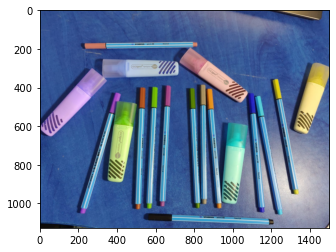

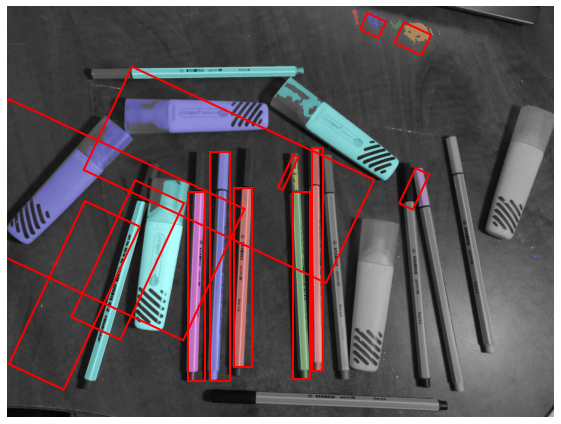

threshold =  138
Number of pens =  17
av_min= 93.11764705882354
av_max =  370.0
1


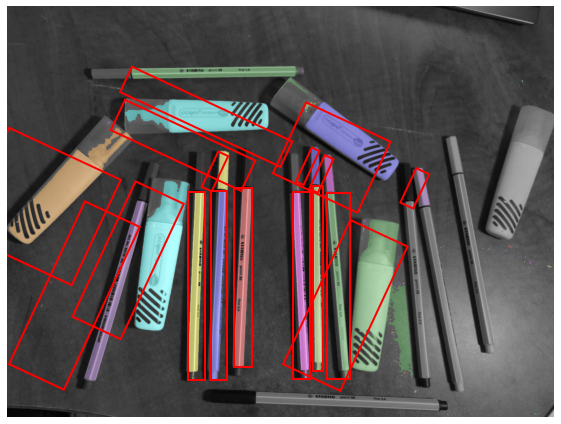

threshold =  148
Number of pens =  19
av_min= 86.94736842105263
av_max =  379.57894736842104
2


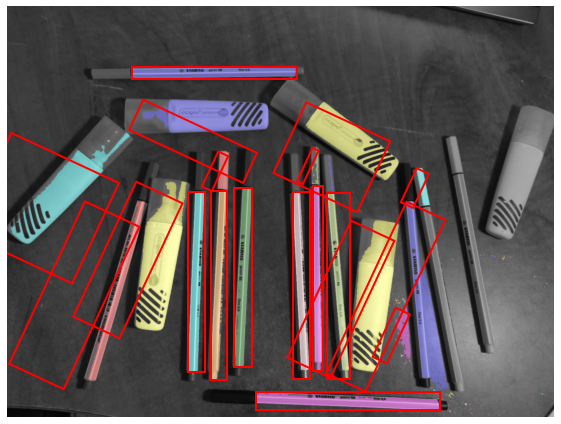

threshold =  158
Number of pens =  20
av_min= 79.3
av_max =  393.7
3


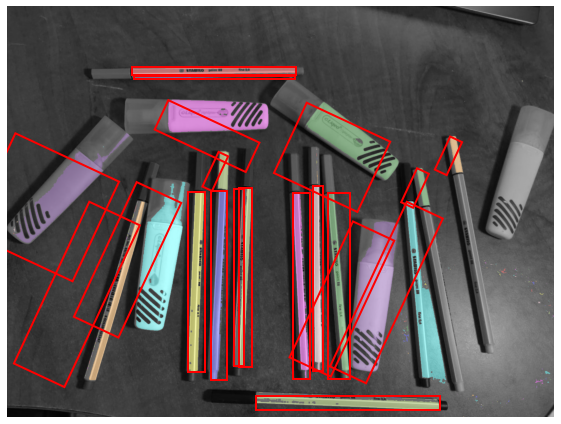

threshold =  168
Number of pens =  25
av_min= 79.12
av_max =  362.76
4


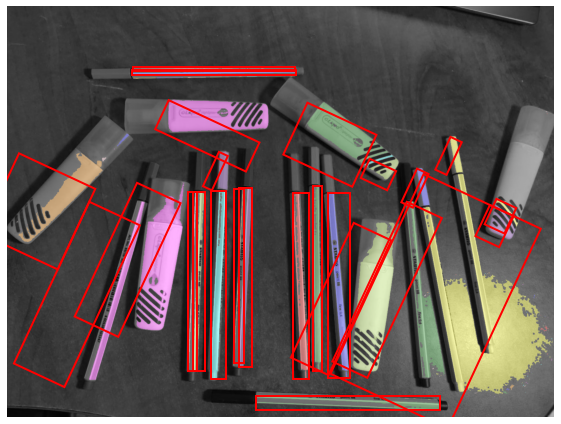

threshold =  178
Number of pens =  27
av_min= 70.66666666666667
av_max =  357.0740740740741
5


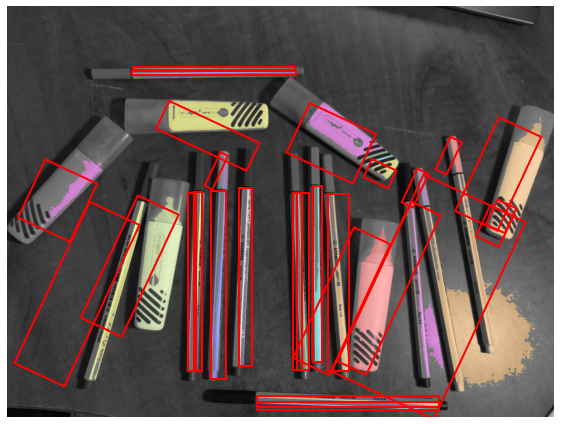

threshold =  188
Number of pens =  29
av_min= 61.41379310344828
av_max =  327.8965517241379
6


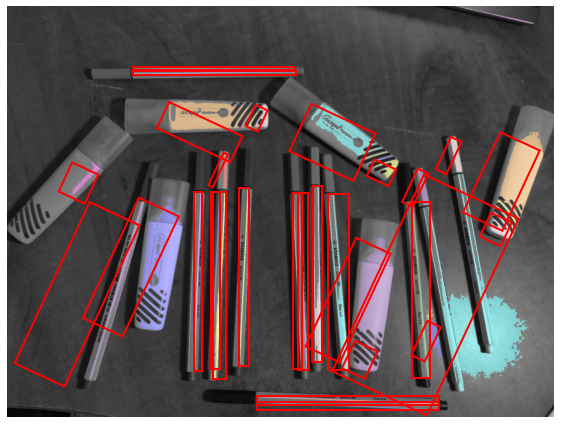

threshold =  198
Number of pens =  23
av_min= 57.34782608695652
av_max =  342.4782608695652
7


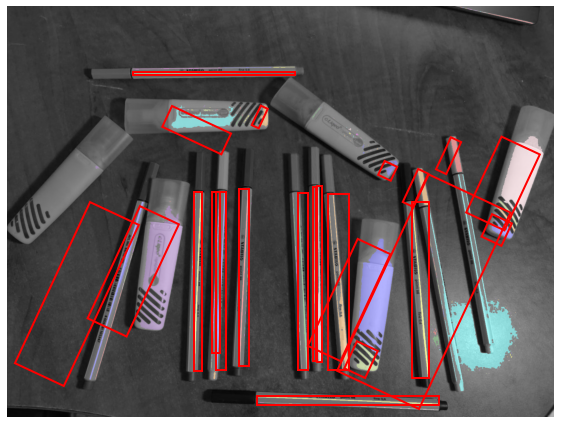

threshold =  208
Number of pens =  17
av_min= 62.411764705882355
av_max =  379.4117647058824
8


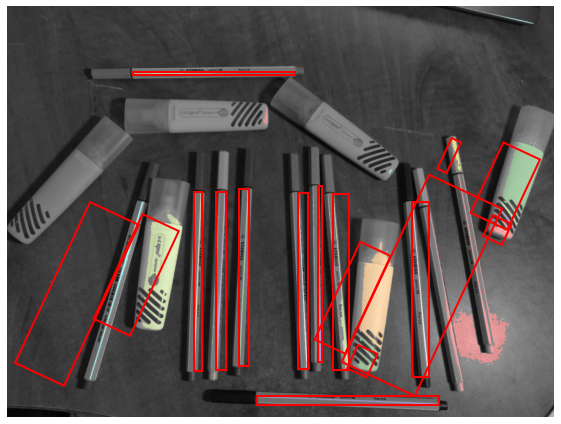

threshold =  218
Number of pens =  17
av_min= 60.35294117647059
av_max =  352.5882352941176
9


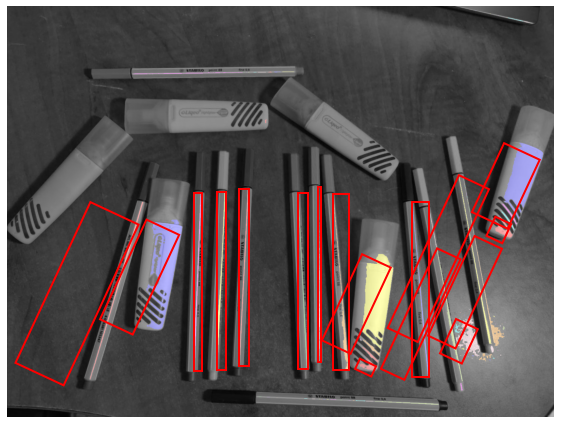

threshold =  228
Number of pens =  13
av_min= 51.38461538461539
av_max =  296.2307692307692
10


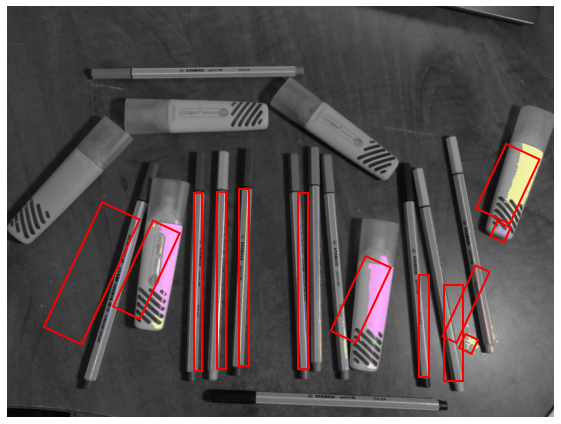

In [45]:
df_ = object_in_img(cv2.imread("pens.jpeg"),0)
# non-flesh, light

In [18]:
df_["FP"][0] = 0 # catched 5, all are true
df_["FN"][0] = 7 # 12 -5 = 7 are missing


df_["FP"][1] = 0 # catched 6, all are true
df_["FN"][1] = 6 # 12 -6 = 6 are missing

df_["FP"][2] = 0 # catched 8, all are true
df_["FN"][2] = 4 # 12 -8 = 4 are missing

df_["FP"][3] = 2# catched 10, 2 are duplicated
df_["FN"][3] = 4# 12 -8 = 4 are missing

df_["FP"][4] = 3# catched 11, 3 are duplicated
df_["FN"][4] = 4# 12 -8 = 4 pens  are missing


df_["FP"][5] = 4# catched 12, 4 are duplicated
df_["FN"][5] = 4# 12 -8 = 4 pens  are missing




df_["FP"][6] = 4# catched 13, 4 are duplicated
df_["FN"][6] = 3# 12 -9 = 3 pens  are missing


df_["FP"][7] = 2# catched 11, 2 are duplicated
df_["FN"][7] = 3# 12 -9 = 3 pens  are missing

####### index 8 is the best parameter for this image!!!
# threshold =  208
# Number of pens =  9
# av_min= 117.88888888888889
# av_max =  716.6666666666666
# indexxxx = > 8

df_["FP"][8] = 0# catched 9, all correct!
df_["FN"][8] = 3# 12 -9 = 3 pens  are missing

df_["FP"][9] = 0# catched 7, all correct!
df_["FN"][9] = 5# 12 -7 = 5 pens  are missing

df_["FP"][10] = 0# catched 6, all correct!
df_["FN"][10] = 6# 12 -6 = 6 pens  are missing 
df_

,Threshold,Num_of_Pens,FP,FN
0,128,5,0,7
1,138,6,0,6
2,148,8,0,4
3,158,10,2,4
4,168,11,3,4
5,178,12,4,4
6,188,13,4,3
7,198,11,2,3
8,208,9,0,3
9,218,7,0,5


Text(0, 0.5, 'Number of pens')

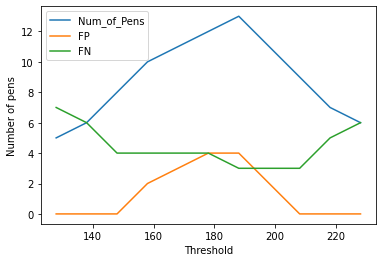

In [19]:
lines = df_.plot.line(x='Threshold')
plt.ylabel("Number of pens")

Original thresh =  127
threshold =  127
Number of pens =  1
av_min= 1726.0
av_max =  5928.0
0


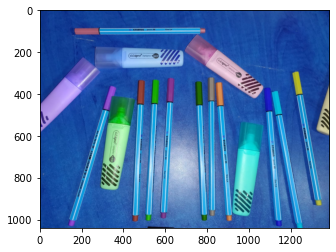

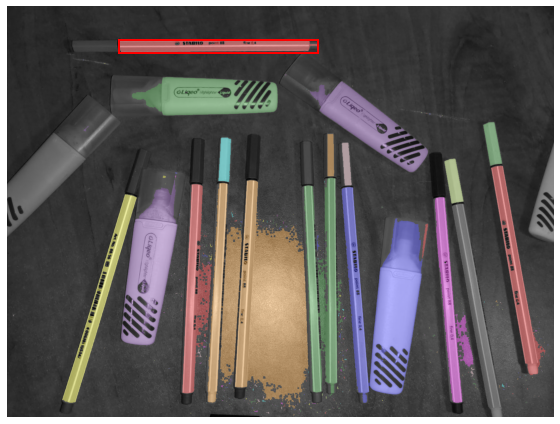

threshold =  137
Number of pens =  7
av_min= 240.14285714285714
av_max =  1039.2857142857142
1


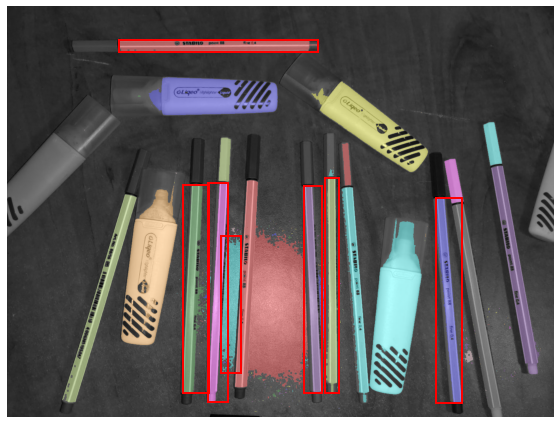

threshold =  147
Number of pens =  7
av_min= 273.7142857142857
av_max =  1086.5714285714287
2


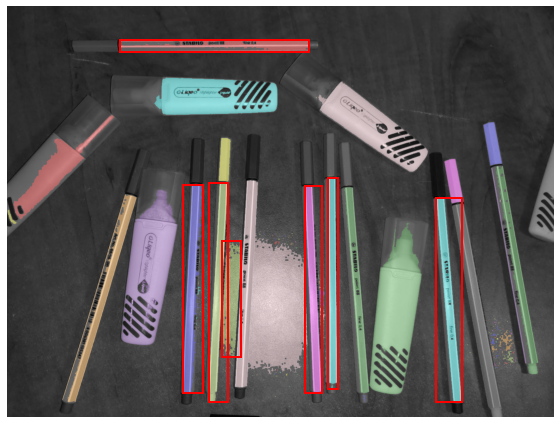

threshold =  157
Number of pens =  10
av_min= 208.6
av_max =  984.6
3


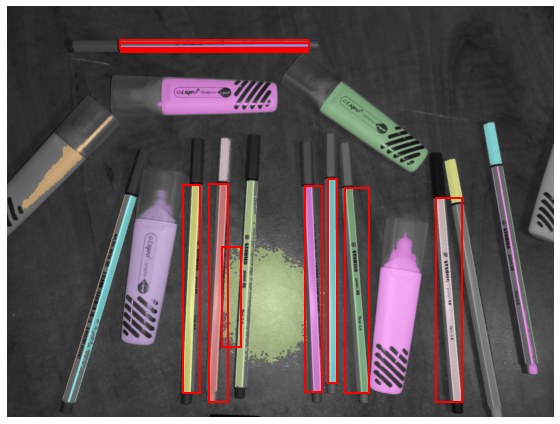

threshold =  167
Number of pens =  9
av_min= 204.55555555555554
av_max =  995.8888888888889
4


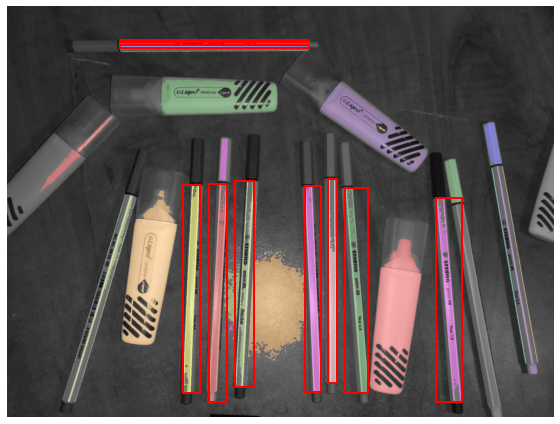

threshold =  177
Number of pens =  10
av_min= 160.0
av_max =  858.6
5


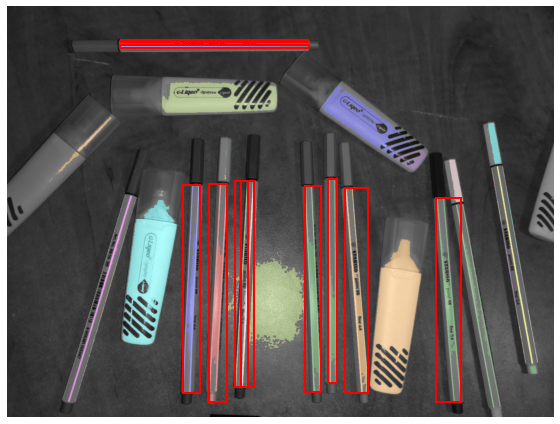

threshold =  187
Number of pens =  10
av_min= 158.0
av_max =  846.1
6


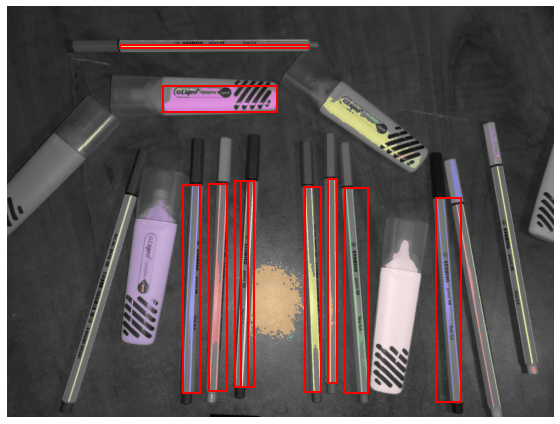

threshold =  197
Number of pens =  13
av_min= 103.38461538461539
av_max =  733.3076923076923
7


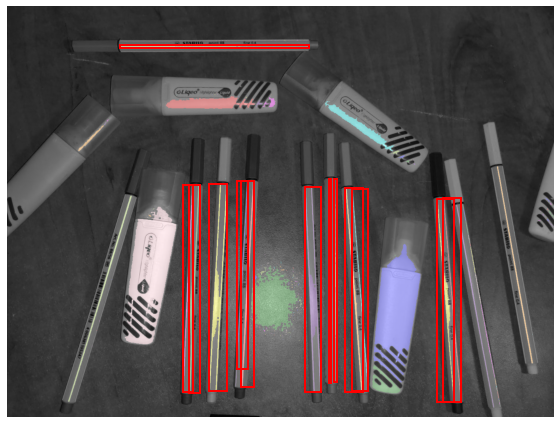

threshold =  207
Number of pens =  9
av_min= 123.0
av_max =  812.6666666666666
8


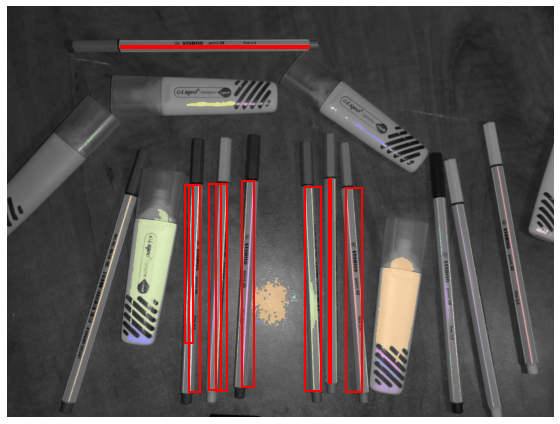

threshold =  217
Number of pens =  8
av_min= 93.625
av_max =  685.375
9


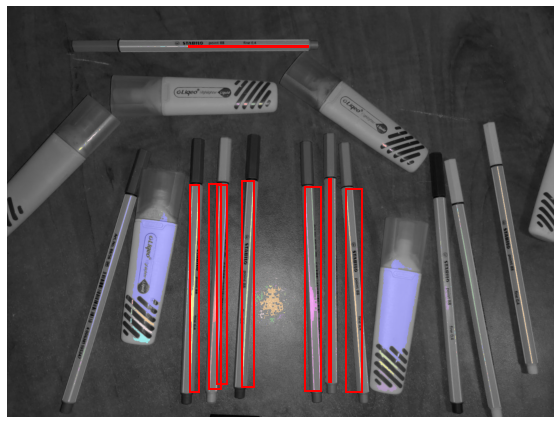

threshold =  227
Number of pens =  4
av_min= 90.0
av_max =  631.5
10


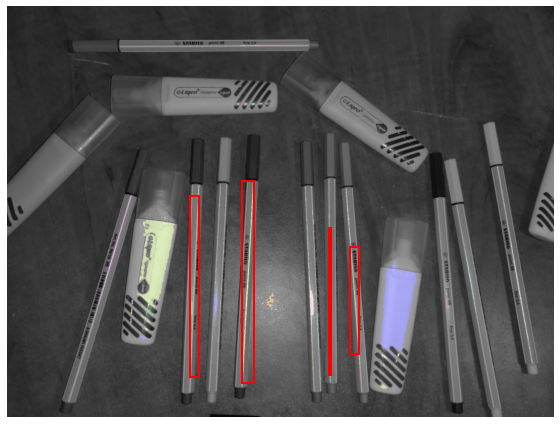

In [20]:
df_1 = object_in_img(cv2.imread("pens1.jpeg"),0)
# flesh + light

Original thresh =  128
threshold =  128
Number of pens =  2
av_min= 924.0
av_max =  3172.0
0


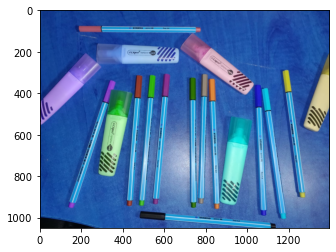

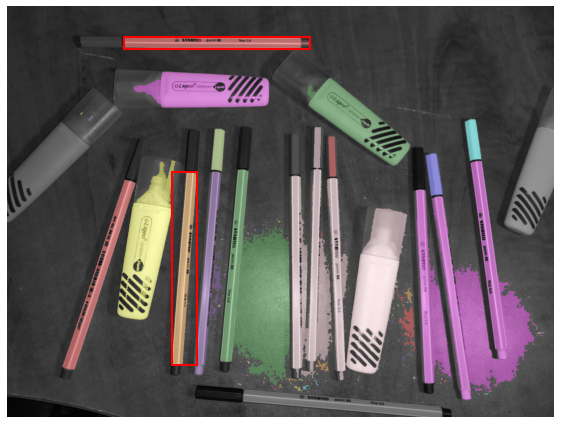

threshold =  138
Number of pens =  6
av_min= 287.5
av_max =  1151.3333333333333
1


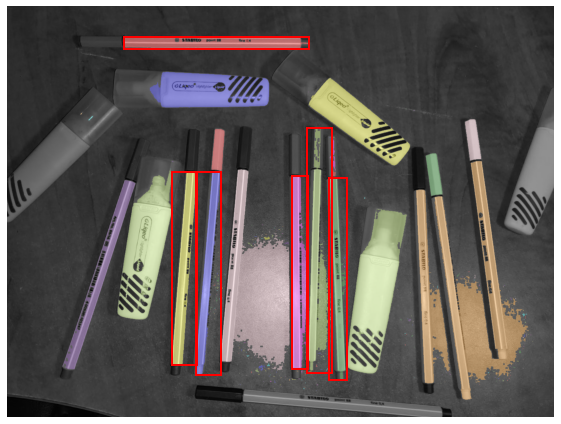

threshold =  148
Number of pens =  6
av_min= 324.8333333333333
av_max =  1225.6666666666667
2


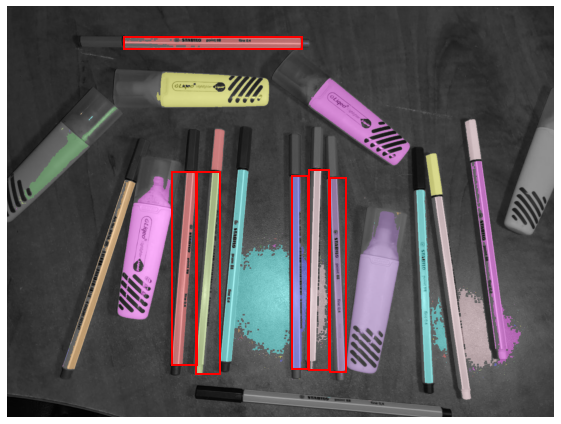

threshold =  158
Number of pens =  8
av_min= 231.875
av_max =  987.5
3


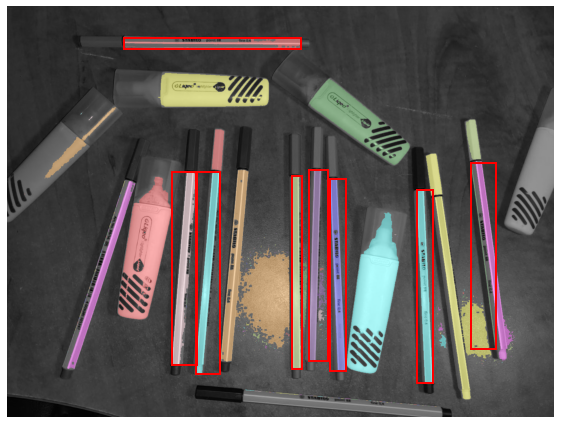

threshold =  168
Number of pens =  10
av_min= 171.9
av_max =  856.3
4


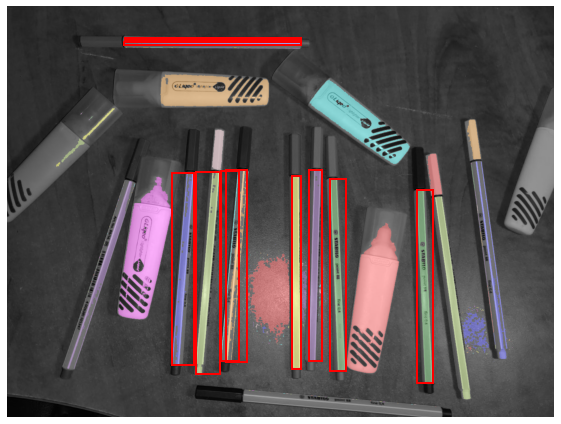

threshold =  178
Number of pens =  12
av_min= 135.33333333333334
av_max =  761.3333333333334
5


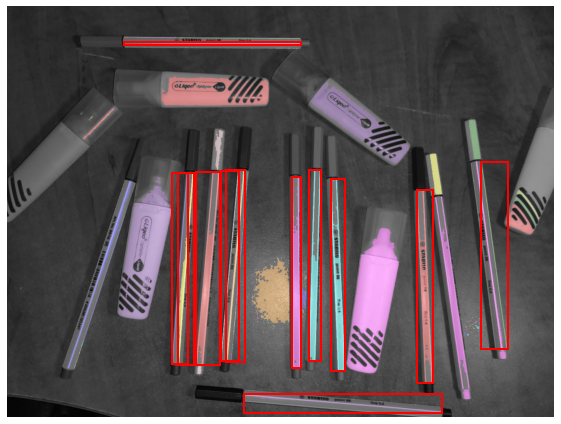

threshold =  188
Number of pens =  12
av_min= 137.83333333333334
av_max =  709.1666666666666
6


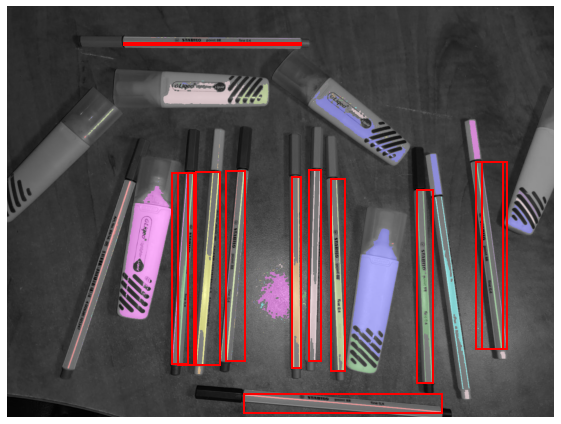

threshold =  198
Number of pens =  10
av_min= 137.8
av_max =  770.7
7


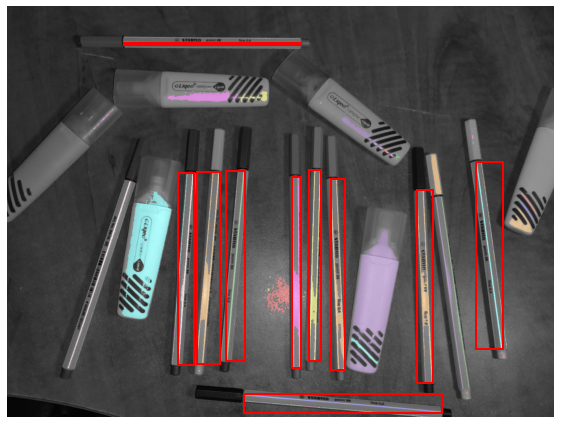

threshold =  208
Number of pens =  13
av_min= 79.23076923076923
av_max =  568.7692307692307
8


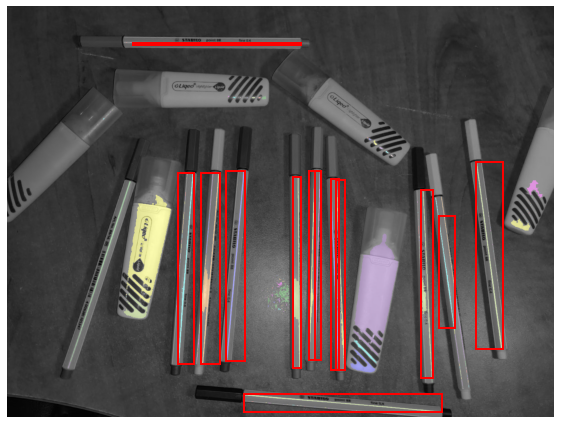

threshold =  218
Number of pens =  7
av_min= 92.28571428571429
av_max =  605.4285714285714
9


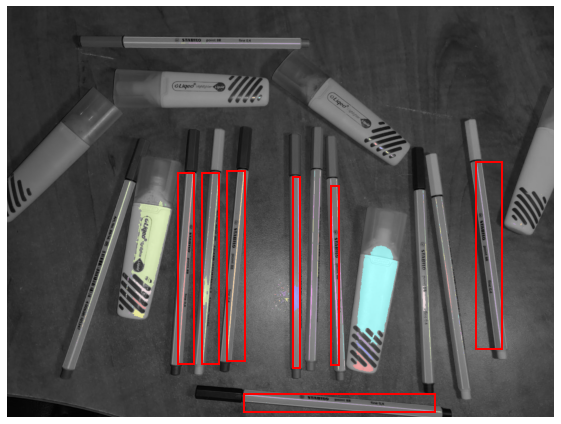

threshold =  228
Number of pens =  2
av_min= 134.5
av_max =  746.0
10


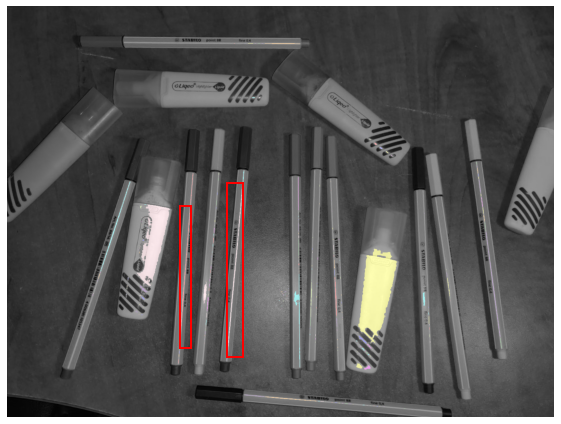

In [21]:
df_2 = object_in_img(cv2.imread("pens2.jpeg"),0) ### i = 8, threshold =208
# flesh + light diff angele

Original thresh =  128
threshold =  128
Number of pens =  5
av_min= 206.0
av_max =  1059.2
0


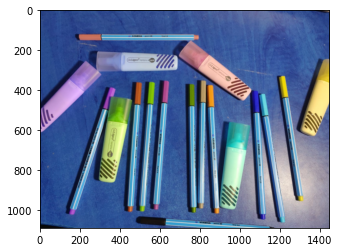

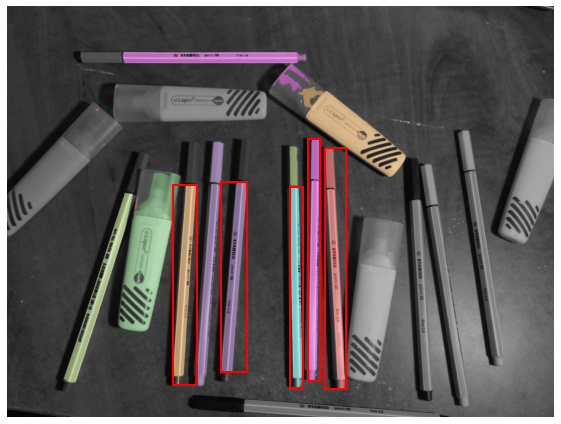

threshold =  138
Number of pens =  5
av_min= 256.4
av_max =  1214.8
1


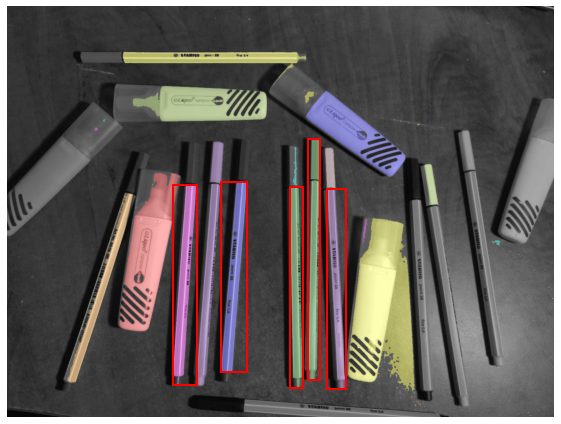

threshold =  148
Number of pens =  7
av_min= 192.85714285714286
av_max =  927.0
2


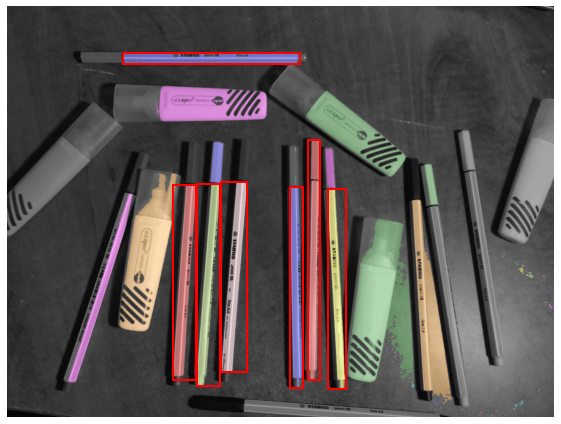

threshold =  158
Number of pens =  7
av_min= 250.28571428571428
av_max =  1021.5714285714286
3


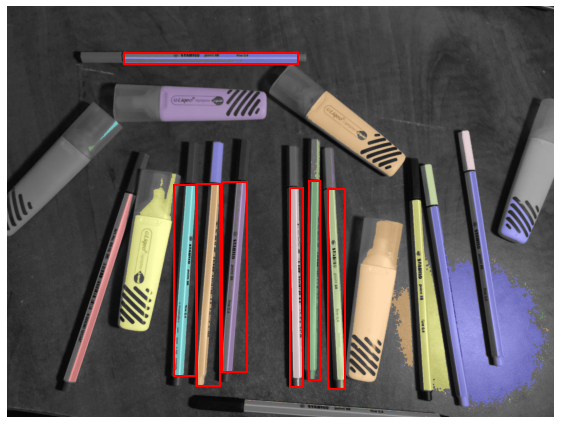

threshold =  168
Number of pens =  8
av_min= 238.75
av_max =  982.0
4


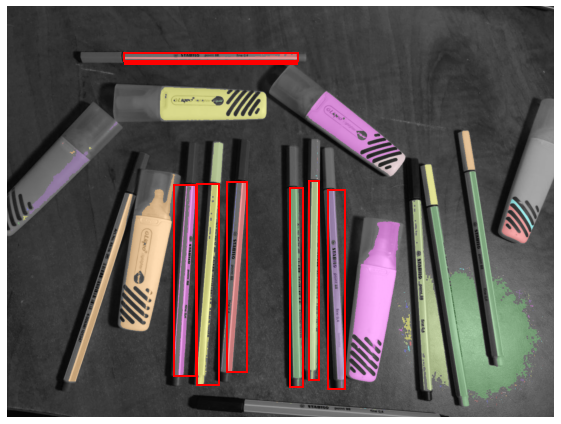

threshold =  178
Number of pens =  10
av_min= 171.7
av_max =  846.4
5


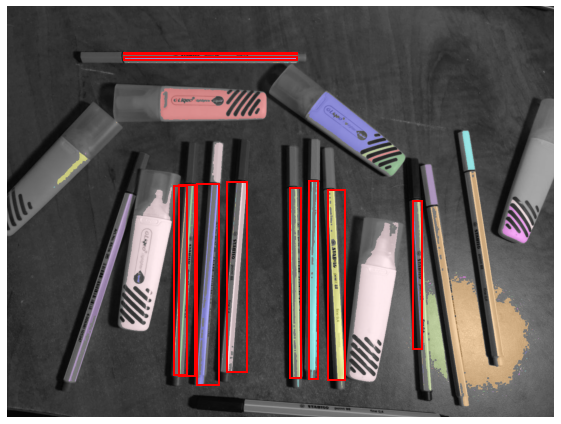

threshold =  188
Number of pens =  11
av_min= 138.1818181818182
av_max =  778.1818181818181
6


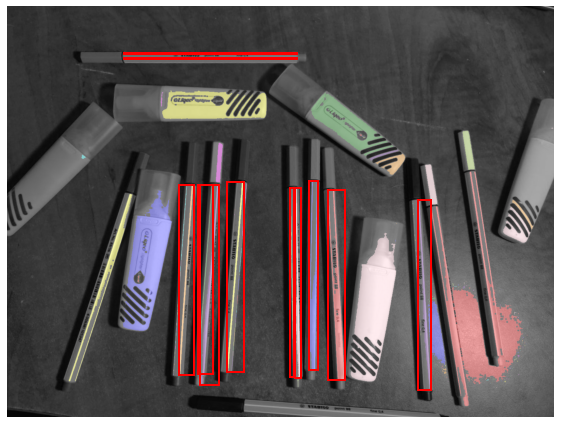

threshold =  198
Number of pens =  9
av_min= 177.88888888888889
av_max =  896.0
7


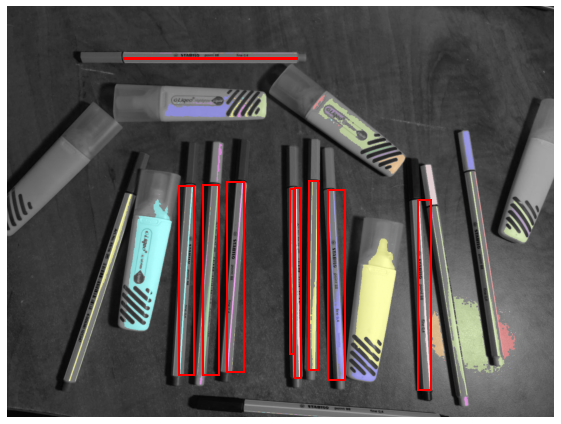

threshold =  208
Number of pens =  8
av_min= 149.25
av_max =  901.0
8


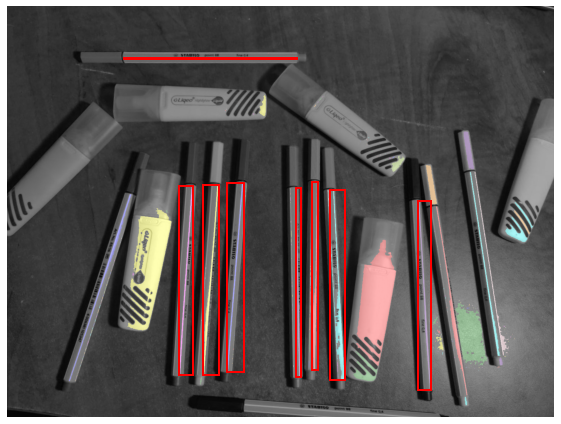

threshold =  218
Number of pens =  8
av_min= 108.5
av_max =  751.375
9


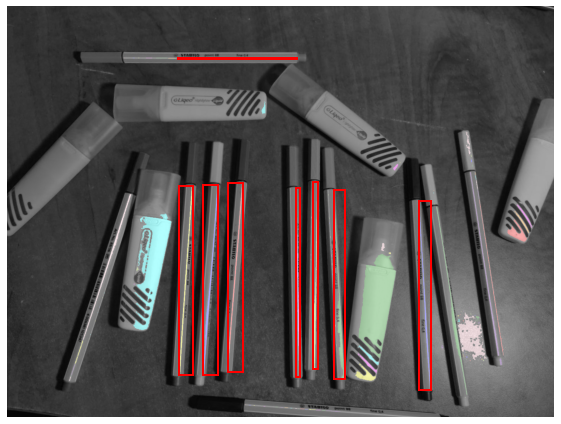

threshold =  228
Number of pens =  9
av_min= 76.22222222222223
av_max =  569.2222222222222
10


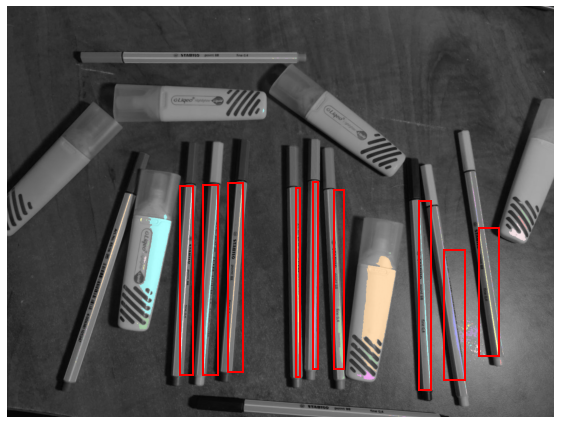

In [22]:
df_3 = object_in_img(cv2.imread("pens3.jpeg"),0) #i=10, threshold = 228

Original thresh =  128
threshold =  128
Number of pens =  6
av_min= 206.0
av_max =  845.1666666666666
0


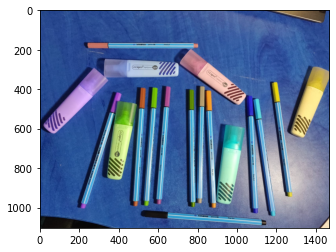

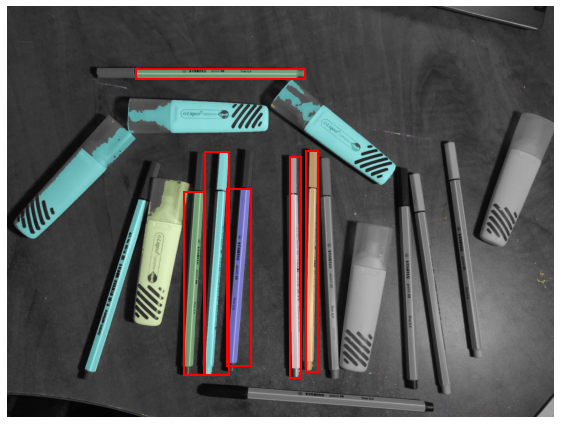

threshold =  138
Number of pens =  8
av_min= 193.75
av_max =  863.625
1


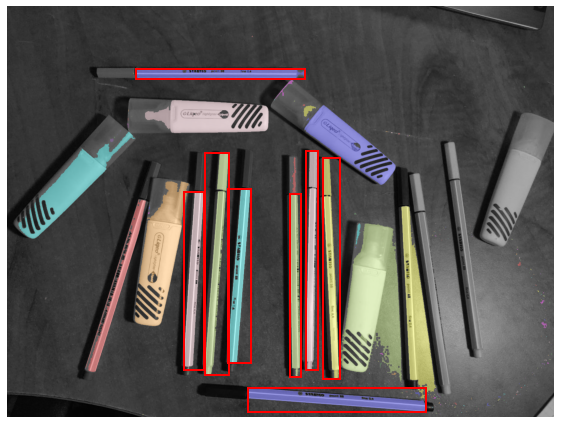

threshold =  148
Number of pens =  8
av_min= 236.25
av_max =  931.25
2


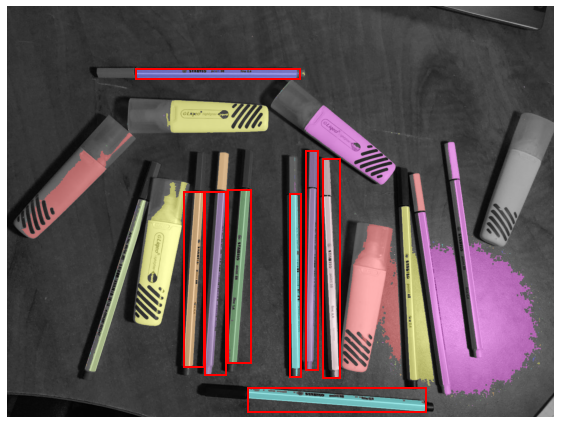

threshold =  158
Number of pens =  8
av_min= 226.125
av_max =  915.375
3


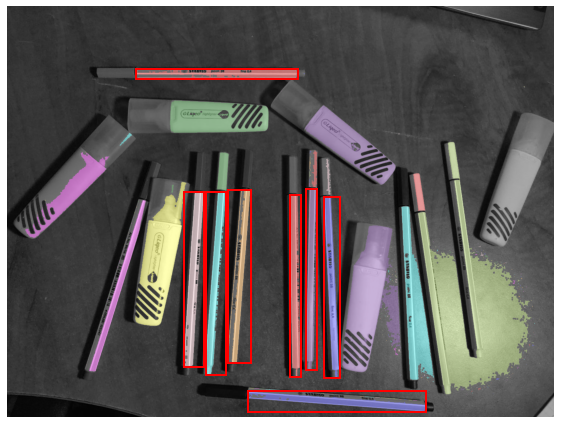

threshold =  168
Number of pens =  9
av_min= 218.22222222222223
av_max =  889.3333333333334
4


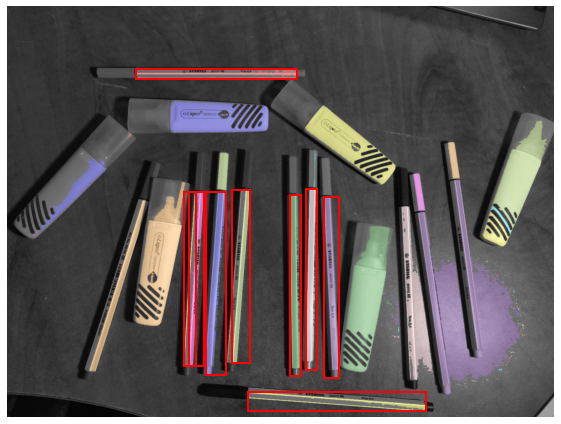

threshold =  178
Number of pens =  13
av_min= 140.53846153846155
av_max =  701.8461538461538
5


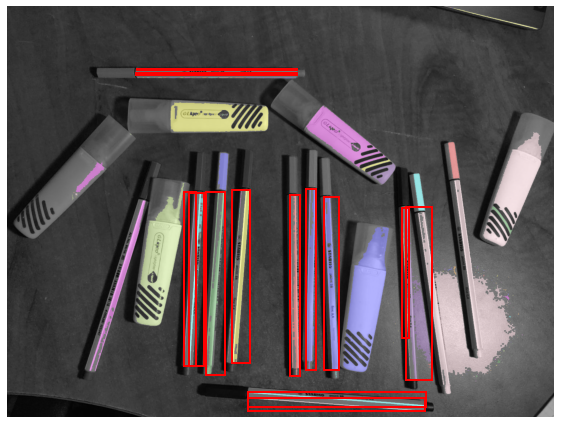

threshold =  188
Number of pens =  14
av_min= 113.35714285714286
av_max =  675.2857142857143
6


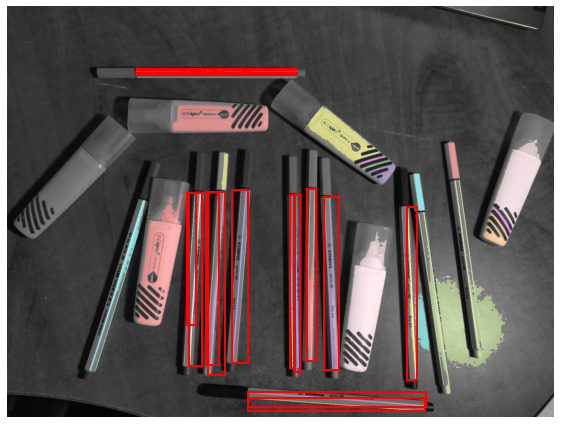

threshold =  198
Number of pens =  10
av_min= 153.9
av_max =  780.4
7


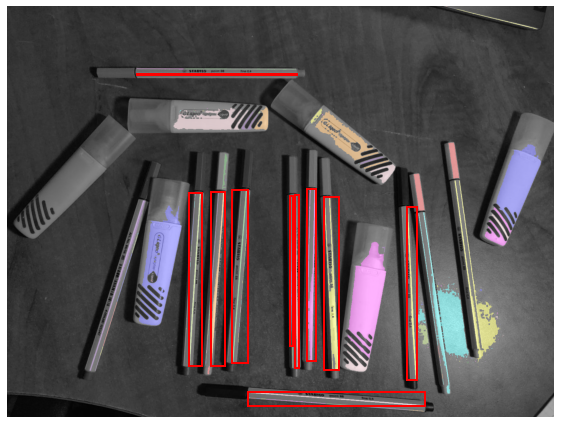

threshold =  208
Number of pens =  10
av_min= 124.8
av_max =  765.7
8


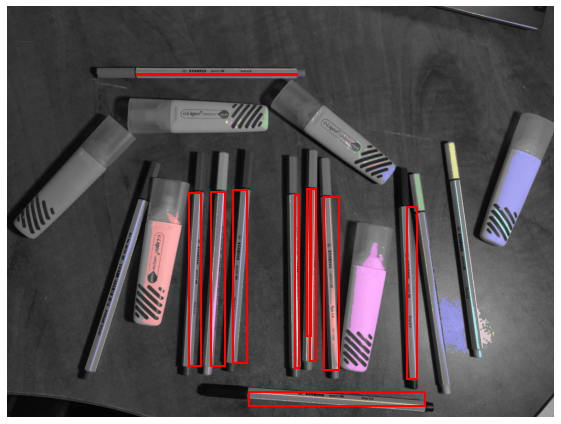

threshold =  218
Number of pens =  12
av_min= 86.5
av_max =  576.8333333333334
9


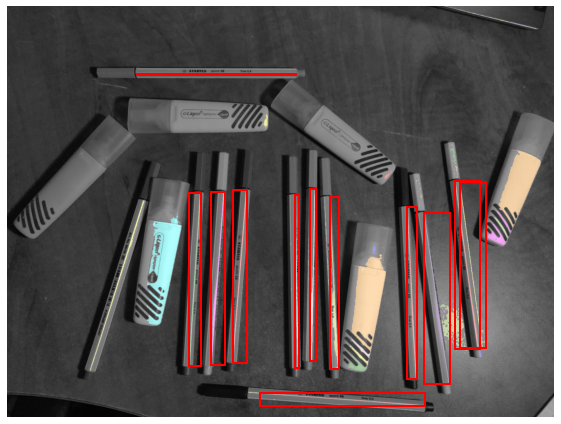

threshold =  228
Number of pens =  9
av_min= 81.22222222222223
av_max =  574.8888888888889
10


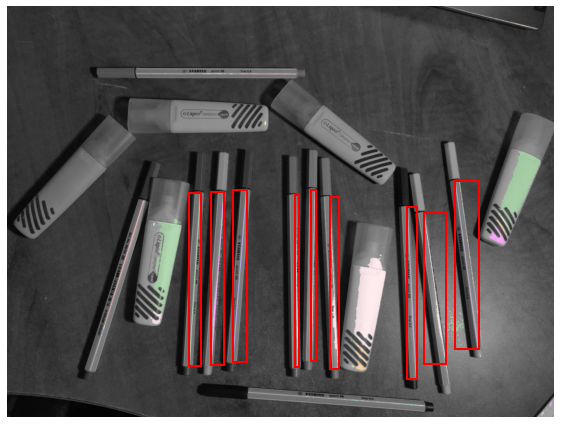

In [23]:
df_4 = object_in_img(cv2.imread("pens4.jpeg"),0) #i=10, threshold = 228
# no-flesh, with light, diff angele

Build the table and Print the other's FP & FN graphs ###

In [39]:

# wb = img_as_ubyte(image = data.coins()[50:-50, 50:-50])
# scale = 0.6
# threshold = threshold_otsu(wb)
# thresh_img = wb < threshold

# edge_touching_removed = clear_border(thresh_img)
# label_image = measure.label(edge_touching_removed, connectivity=wb.ndim)
# image_label_overlay = label2rgb(label_image, image = wb)

# all_props = measure.regionprops(label_image, wb)
# for prop in all_props:
#     print('Label: {} Area: {}'.format(prop.label, prop.area))